# Treinamento de modelo de detecção de objetos com YOLOv5 - TCC USP/ESALQ - Wagner Takeshi Obara.

## Verificações iniciais

O Intuito deste bloco é verificar se o seu sistema está apto a executar o treinamento com recursos de **GPU** e **high-RAM**

In [2]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat May 14 22:02:05 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 54.8 gigabytes of available RAM

You are using a high-RAM runtime!


## Clonar repositório e Instalar Dependências do Yolo

Neste bloco, vamos:

  - clonar o repositório do YOLO para obter os scripts de treinamento do modelo.
  - Instalar os pacotes necessários para executar o treinamento.
  - Verificar se PyTorch foi instalado corretamente.

In [3]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 13360, done.
remote: Counting objects: 100% (120/120), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 13360 (delta 74), reused 87 (delta 57), pack-reused 13240
Receiving objects: 100% (13360/13360), 12.14 MiB | 33.70 MiB/s, done.
Resolving deltas: 100% (9295/9295), done.
/content/yolov5


In [4]:
!pip install -qr requirements.txt

import torch

from IPython.display import clear_output

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.11.0+cu113 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


# Download do conjunto de dados 
Aqui vamos fazer o downloado do conjunto de dados no Roboflow no formato Yolo, a base de dados será salvo no diretório yolov5/Face-Mask-Detection-2


In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="xGFPdVj5qPdbvcDKuqe8")
project = rf.workspace().project("face-mask-detection-3voiy")
dataset = project.version(2).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Face-Mask-Detection-2 in yolov5pytorch:: 100%|██████████| 1718/1718 [00:00<00:00, 3984.03it/s]


In [ ]:
%cd /content/yolov5

/content/yolov5


In [ ]:
# imprime as informações sobre a base de dados, como classes e local das imagens do conjunto de treinamento e validação
%cat {dataset.location}/data.yaml

names:
- mask_weared_incorrect
- with_mask
- without_mask
nc: 3
train: Face-Mask-Detection-2/train/images
val: Face-Mask-Detection-2/valid/images


# Configuração do modelo

Aqui vamos ajustar o arquivo (yolov5/models/yolov5s.yaml) de configuração para treinamento do modelo utilizando os hiperparâmetros default do YOLO, alterando apenas o número de classe. 

In [8]:
# Recupera o número de classes no conjunto de dados
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [11]:
# imprime o arquivo de confuguração inicial (sem ajustes)
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [12]:
# Cria comando mágico customizado do IPython para gravar o arquivo de configuração de acordo com um template
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [14]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [17]:
# imprime o arquivo de confuração customizado (com ajustes)
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 3  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

# Treinamento

Nesse bloco vamos executar o script de treinamento do modelo.

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd ../yolov5/
!python train.py --img 416 --batch 16 --epochs 3000 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' \
  --name yolov5s_results  --cache --patience 0

A saída de streaming foi truncada nas últimas 5000 linhas.
     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2003/2999     1.79G    0.0139   0.01173 0.0005512        48       416: 100% 38/38 [00:06<00:00,  6.04it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 6/6 [00:00<00:00,  7.86it/s]
                 all        170        739      0.948      0.576      0.695      0.433

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2004/2999     1.79G   0.01414   0.01188 0.0004994        25       416: 100% 38/38 [00:06<00:00,  6.03it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 6/6 [00:00<00:00,  8.07it/s]
                 all        170        739      0.949      0.575      0.695      0.433

     Epoch   gpu_mem       box       obj       cls    labels  img_size
 2005/2999     1.79G   0.01398   0.01241  0.000528        62       416: 100% 38/38 [00:06<00

# Verificando o desempenho do modelo treinado

Aqui vamos verificar o desempenho do modelo através do tensorboard

In [ ]:
# Inicia o tensorboard
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

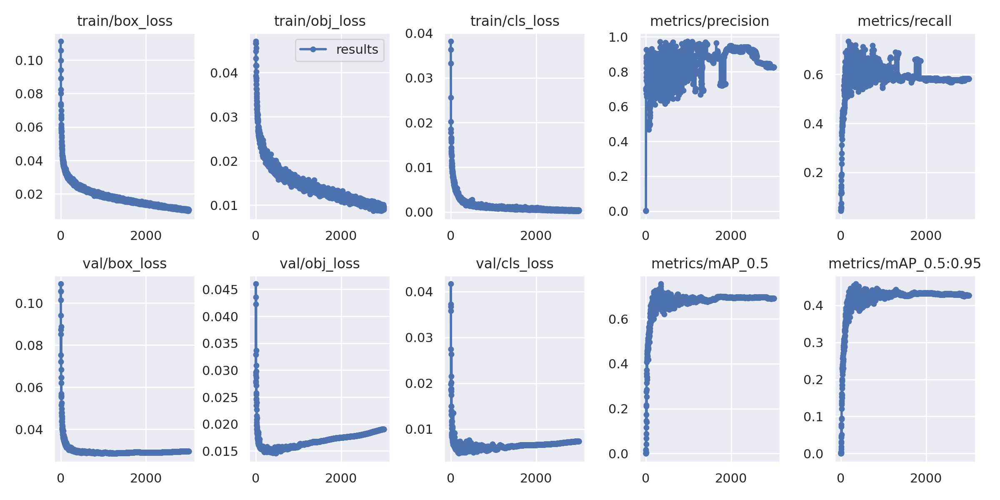

In [ ]:
# Plota imagem results.png
from IPython.display import Image
from utils.plots import plot_results
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

# Executar inferencias na base de teste

Neste bloco vamos utilizar o modelo treinado para executar inferencias no conjunto de teste.

In [ ]:
# Lista os arquivos de pesos gerado no treinamento do modelo.
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [ ]:
# Executa script para detectar os objetos em um conjunto de imagens.  
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/Face-Mask-Detection-2/test/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/Face-Mask-Detection-2/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-168-g5743deb torch 1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7018216 parameters, 0 gradients
image 1/85 /content/yolov5/Face-Mask-Detection-2/test/images/maksssksksss106_png.rf.340cdbc8a266e56935da920e18271100.jpg: 416x416 Done. (0.007s)
image 2/85 /content/yolov5/Face-Mask-Detection-2/test/images/maksssksksss112_png.rf.a6578234cd0d144e8da60c48baaa1cfc.jpg: 416x416 1 mask_weared_incorrect, Done. (0.

In [ ]:
# Plota as imagens com os objetos detectados
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

Output hidden; open in https://colab.research.google.com to view.